#  Alcohol Image Classifier with fast.ai

Using fast.ai to train a deep learning (CNN) classifier to distinguish the different types of popular alcoholic beverages.

This notebook includes the latest instructions on how to utilize the updated Microsoft Azure Bing Search V7 API.

CLEAN VERSION
___

### Contents
- [Section 1 - Setup](#section1)  
- [Section 2 - Downloading Image Data](#section2)  
- [Section 3 - Preparing Image Datasets](#section3)  
- [Section 4 - Training the Model](#section4)  
- [Section 5 - Cleaning the Data](#section5)  
- [Section 6 - Using Image Classifier for Inference](#section6)  
- [Section 7 - Deployment as Web App](#section7)
___


<a name="section1"></a>
## Section 1 - Setup

In [5]:
import os
os.getcwd()

'C:\\Users\\klty0\\Desktop\\GitHub\\Alcohol-Image-Classifier-fastai'

Note: Highly recommend to run this notebook on Google Colab. To find out more about Google Colab setup, please visit: https://course.fast.ai/start_colab  


Once this notebook is open on Google Colab, **do switch on GPU accelerator for the notebook by going to top menu and clicking `Runtime` > `Change runtime type` > Select `GPU` for Hardware Accelerator.**

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
!pip install fastai==2.0.19
!pip install fastai2==0.0.30
!pip install fastcore==1.3.1
!pip install -Uqq fastbook

In [ ]:
import fastbook
from fastbook import *
fastbook.setup_book()
from fastai.vision.widgets import *

import warnings
warnings.filterwarnings("ignore")

import requests
import matplotlib.pyplot as plt
from PIL import Image
from io import BytesIO
import os

from IPython.display import Image
from IPython.core.display import HTML 

In [ ]:
try:
  os.mkdir('images')
except:
  pass

In [ ]:
subscription_key = "XXX" # Replace XXX with your API key
search_url = "https://api.bing.microsoft.com/v7.0/images/search"
headers = {"Ocp-Apim-Subscription-Key" : subscription_key}

In [ ]:
search_term = "whisky"

In [ ]:
# Add in the count parameter so that each call can retrieve the max number of images (set at 150). Otherwise the default is 35.
params  = {"q": search_term, "license": "public", "imageType": "photo", "count":"150"}

In [ ]:
response = requests.get(search_url, headers=headers, params=params)
response.raise_for_status()
search_results = response.json()
thumbnail_urls = [img["thumbnailUrl"] for img in search_results["value"][:16]]

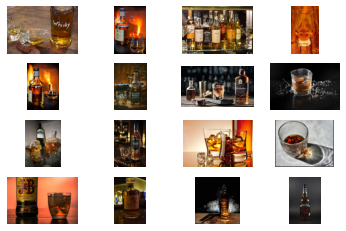

In [ ]:
f, axes = plt.subplots(4, 4)
for i in range(4):
    for j in range(4):
        image_data = requests.get(thumbnail_urls[i+4*j])
        image_data.raise_for_status()
        image = Image.open(BytesIO(image_data.content))        
        axes[i][j].imshow(image)
        axes[i][j].axis("off")
plt.show()

In [ ]:
img_urls = [img['contentUrl'] for img in search_results["value"]]

In [ ]:
len(img_urls)

150

In [ ]:
img_urls[1]

'https://c.pxhere.com/photos/79/21/whisky_whiskey_alcohol_glass_bottle_whiskey_glass_whiskey_bottle_drink-1363735.jpg!d'

In [ ]:
dest = 'images/whisky_test.jpg'
download_url(img_urls[1], dest)

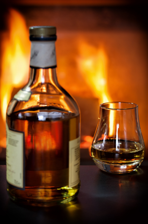

In [ ]:
img = Image.open(dest)
img.to_thumb(224,224)

<a name="section2"></a>
## Section 2 - Downloading Image Data

In [ ]:
alcohol_types = ['whisky','wine','beer']
path = Path('alcohol')

In [ ]:
if not path.exists():
    path.mkdir()
    for alc_type in alcohol_types:
        dest = (path/alc_type)
        dest.mkdir(exist_ok=True)
        
        # Obtaining list of image URLs with that alcohol type keyword
        search_term = alc_type
        params  = {"q": search_term, "license": "public", "imageType": "photo", "count":"150"}
        response = requests.get(search_url, headers=headers, params=params)
        response.raise_for_status()
        search_results = response.json()
        img_urls = [img['contentUrl'] for img in search_results["value"]]
        
        # Downloading images from the list of image URLs
        download_images(dest, urls=img_urls)

In [ ]:
img_files = get_image_files(path)
img_files

(#445) [Path('alcohol/beer/00000069.jpeg'),Path('alcohol/beer/00000007.jpg'),Path('alcohol/beer/00000092.jpg'),Path('alcohol/beer/00000054.jpg'),Path('alcohol/beer/00000082.jpg'),Path('alcohol/beer/00000071.jpg'),Path('alcohol/beer/00000045.jpg'),Path('alcohol/beer/00000134.jpg'),Path('alcohol/beer/00000061.jpg'),Path('alcohol/beer/00000138.jpg')...]

In [ ]:
failed = verify_images(img_files)
failed

(#7) [Path('alcohol/beer/00000008.jpg'),Path('alcohol/beer/00000031.png'),Path('alcohol/whisky/00000076.jpg'),Path('alcohol/whisky/00000131.jpg'),Path('alcohol/whisky/00000083.jpg'),Path('alcohol/wine/00000148.jpg'),Path('alcohol/wine/00000126.png')]

In [ ]:
failed.map(Path.unlink)

(#7) [None,None,None,None,None,None,None]

___
<a name="section3"></a>
## Section 3 - Preparing Image Datasets

In [ ]:
alcohols = DataBlock(
    blocks=(ImageBlock, CategoryBlock), 
    get_items=get_image_files, 
    splitter=RandomSplitter(valid_pct=0.2, seed=1),
    get_y=parent_label,
    item_tfms=Resize(128))

In [ ]:
dls = alcohols.dataloaders(path)

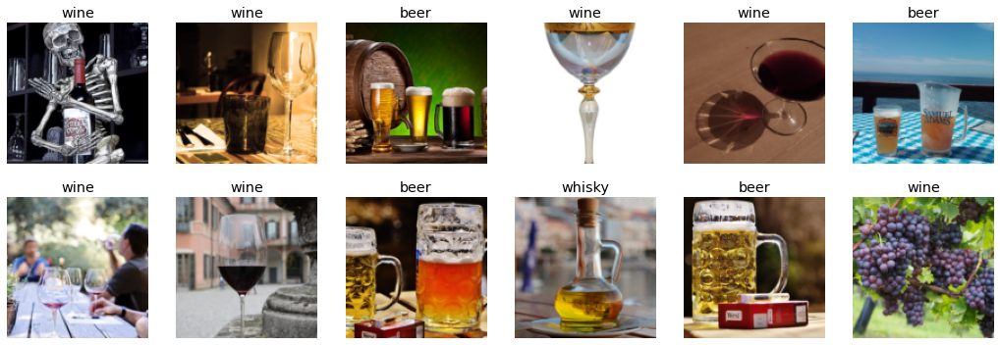

In [ ]:
dls.valid.show_batch(max_n=12, nrows=2)

### Demonstrating Data Augmentation

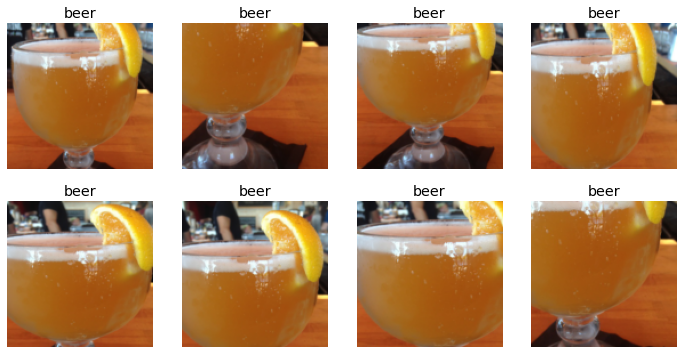

In [ ]:
alcohols = alcohols.new(item_tfms=RandomResizedCrop(128, min_scale=0.3))
dls = alcohols.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

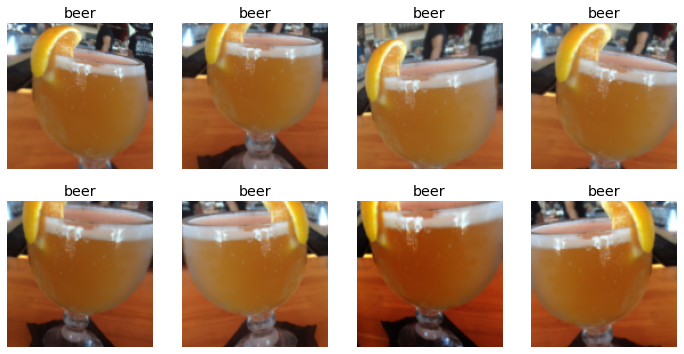

In [ ]:
alcohols = alcohols.new(item_tfms=Resize(128), batch_tfms=aug_transforms())
dls = alcohols.dataloaders(path)
dls.train.show_batch(max_n=8, nrows=2, unique=True)

<a name="section4"></a>
## Section 4 - Training the Model

In [ ]:
alcohols = alcohols.new(
    item_tfms=RandomResizedCrop(224, min_scale=0.5),
    batch_tfms=aug_transforms())
dls = alcohols.dataloaders(path)

In [ ]:
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

Downloading: "https://download.pytorch.org/models/resnet34-333f7ec4.pth" to /root/.cache/torch/hub/checkpoints/resnet34-333f7ec4.pth


epoch,train_loss,valid_loss,error_rate,time
0,1.917758,0.872013,0.367816,01:04


epoch,train_loss,valid_loss,error_rate,time
0,1.022075,0.728177,0.287356,01:04
1,0.861191,0.730078,0.241379,01:04
2,0.722445,0.735297,0.229885,01:03
3,0.622880,0.728579,0.229885,01:05


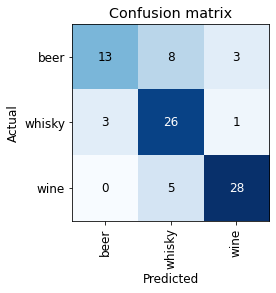

In [ ]:
interpretation = ClassificationInterpretation.from_learner(learn)
interpretation.plot_confusion_matrix()

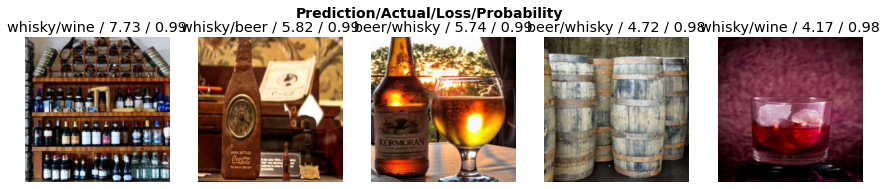

In [ ]:
interpretation.plot_top_losses(5, nrows=1)

<a name="section5"></a>
## Section 5 - Cleaning the Data

In [ ]:
cleaner = ImageClassifierCleaner(learn)
cleaner

<img src="./images/cleaner_gui.png" width="100%" align = "left">

In [ ]:
# Delete images marked as delete
for idx in cleaner.delete(): cleaner.fns[idx].unlink()
    
# Update category of image to the newly specified category by moving it into the appropriate folder
for idx,cat in cleaner.change(): shutil.copyfile(cleaner.fns[idx], path/cat)

#### Retraining the model after data cleaning

In [ ]:
dls = alcohols.dataloaders(path)
learn = cnn_learner(dls, resnet34, metrics=error_rate)
learn.fine_tune(4)

epoch,train_loss,valid_loss,error_rate,time
0,1.706442,0.859622,0.373494,01:02


epoch,train_loss,valid_loss,error_rate,time
0,1.027927,0.637664,0.253012,01:01
1,0.842299,0.530150,0.168675,01:01
2,0.704084,0.418563,0.120482,01:01
3,0.609572,0.377956,0.096386,01:01


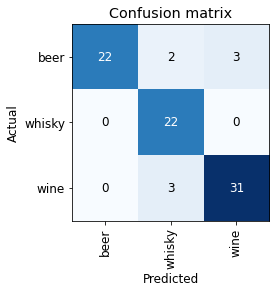

In [ ]:
interpretation = ClassificationInterpretation.from_learner(learn)
interpretation.plot_confusion_matrix()

In [ ]:
learn.export()

In [ ]:
path = Path()
path.ls(file_exts='.pkl')

(#1) [Path('export.pkl')]

<a name="section6"></a>
## Section 6 - Using Image Classifier for Inference

In [ ]:
learn_inf = load_learner(path/'export.pkl')

In [ ]:
# Sample image
ims = ['https://alcohaul.sg/products/i/400/5f7edfe79ae56e6d7b8b49cf_0.jpg']
dest = 'images/test_whisky.jpg'
download_url(ims[0], dest)

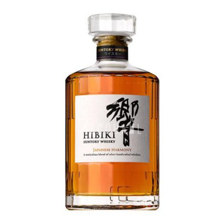

In [ ]:
im = Image.open(dest)
im.to_thumb(224,224)

In [ ]:
learn_inf.predict('images/test_whisky.jpg')

('whisky', tensor(1), tensor([4.1783e-04, 9.9951e-01, 7.0310e-05]))

In [ ]:
learn_inf.dls.vocab

['beer', 'whisky', 'wine']

<a name="section7"></a>
## Section 7 - Deployment as Web App

In [ ]:
btn_upload = widgets.FileUpload()
btn_upload

FileUpload(value={}, description='Upload')

<img src="./images/btn_upload.png" width="30%" align = "left">

In [ ]:
# Retrieving the uploaded image
img = PILImage.create(btn_upload.data[-1])

In [ ]:
out_pl = widgets.Output()
out_pl.clear_output()
with out_pl: display(img.to_thumb(224,224))
out_pl

Output()

<img src="./images/img_talisker.png" width="30%" align = "left">

In [ ]:
pred,pred_idx,probs = learn_inf.predict(img)

In [ ]:
lbl_pred = widgets.Label()
lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'
lbl_pred

Label(value='Prediction: whisky; Probability: 0.9965')

<img src="./images/lbl_pred.png" width="30%" align = "left">

In [ ]:
btn_run = widgets.Button(description='Classify Image')
btn_run

Button(description='Classify Image', style=ButtonStyle())

<img src="./images/btn_run.png" width="30%" align = "left">

In [ ]:
def on_click_classify(change):
    img = PILImage.create(btn_upload.data[-1])
    out_pl.clear_output()
    with out_pl: display(img.to_thumb(128,128))
    pred,pred_idx,probs = learn_inf.predict(img)
    lbl_pred.value = f'Prediction: {pred}; Probability: {probs[pred_idx]:.04f}'

btn_run.on_click(on_click_classify)

In [ ]:
VBox([widgets.Label('Select your alcohol!'), 
      btn_upload, btn_run, out_pl, lbl_pred])

<img src="./images/VBox.png" width="30%" align = "left">

___